In [1]:
import warnings
warnings.filterwarnings('ignore')


import anndata as ad
import squidpy as sq
import scanpy as sc

import numpy as np
import pandas as pd
import os

import re
import json

import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib.colors import ListedColormap
from cycler import cycler

In [2]:
# --------------------------------------------------------------------------------
# Edit this path
# --------------------------------------------------------------------------------
#FILEPATHBASE = '/Users/mmd47/Library/CloudStorage/GoogleDrive-mmd47@yale.edu/My Drive/DiStasio Lab/DiStasio Lab Share/02 Analysis'
#FILEPATHBASE = '/home/mdistasio/YaleGoogleDrive/DiStasio Lab/DiStasio Lab Share/02 Analysis'
FILEPATHBASE = '/home/mmd47/project/retina_curio'



# --------------------------------------------------------------------------------
SAVEFIGS = False
if SAVEFIGS:
    IMGDIR = os.path.join(FILEPATHBASE, 'annData_ManualAnnotate', 'img', 'tmp')



In [3]:
# --------------------------------------------------------------------------------
# Load integrated datasets (generated by IntegrateHarmony.py)
# --------------------------------------------------------------------------------
filename = os.path.join(FILEPATHBASE, 'annData_ManualAnnotate', 'calc', 'retinas_all_integrated_harmony.h5ad')
print("Loading Data from: " + filename)
retinas_all = ad.read_h5ad(filename)

SampleKey = retinas_all.uns["SampleKey"]
Samples = list(retinas_all.obs['dataset'].cat.categories)

Loading Data from: /home/mmd47/project/retina_curio/annData_ManualAnnotate/calc/retinas_all_integrated_harmony.h5ad


In [4]:
retinas_all

AnnData object with n_obs × n_vars = 62961 × 3000
    obs: 'Retina_2', 'OpticNerve', 'Retina_1', 'Retina', 'dataset', 'batch', 'leiden'
    var: 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'Anatomic_Location', 'SampleKey', 'hvg', 'leiden', 'leiden_sizes', 'neighbors', 'paga', 'pca', 'spatial', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_spatial', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

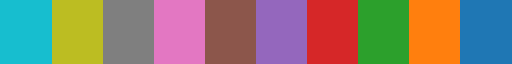

In [5]:
GroupsToAnalyze = list(np.arange(0,10))
groups = [sorted(np.unique(retinas_all.obs['leiden']), key=lambda x: int(x))[i] for i in GroupsToAnalyze]

retinas_all.obs['leiden_sel'] = retinas_all.obs['leiden']
retinas_all.obs['leiden_sel'] = retinas_all.obs['leiden_sel'].cat.add_categories('Other')
retinas_all.obs['leiden_sel'][~retinas_all.obs['leiden'].isin(groups)] = 'Other'
retinas_all.obs['leiden_sel'] = retinas_all.obs['leiden_sel'].cat.remove_unused_categories()

nGroupsToPlot = len(GroupsToAnalyze)

spect = plt.cm.tab10.resampled(nGroupsToPlot)
newcolors = np.flip(spect(np.linspace(0,1,nGroupsToPlot)), axis=0)
newpalette = ListedColormap(newcolors)
color_cycler = cycler(color=newpalette.colors)
newpalette

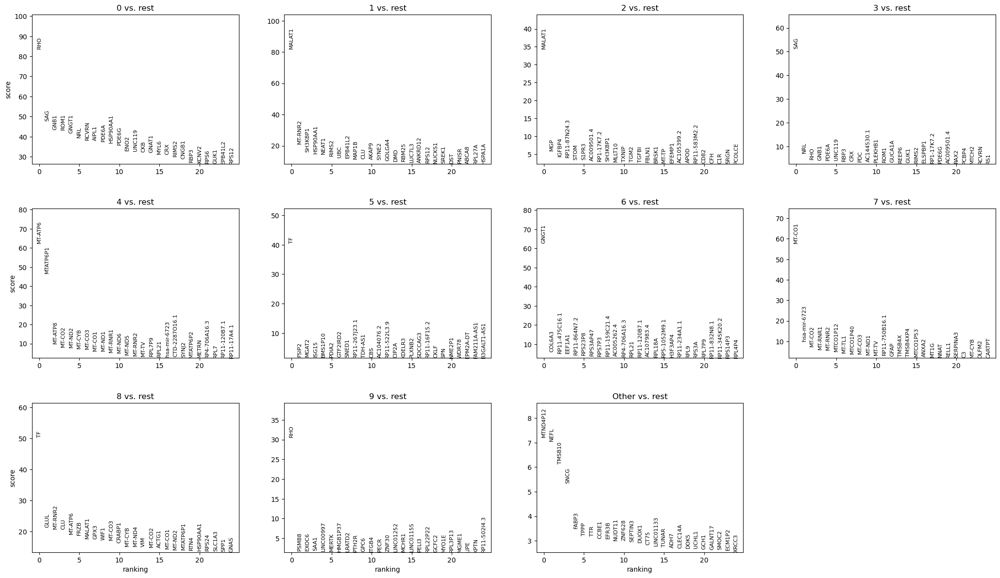

<Axes: >

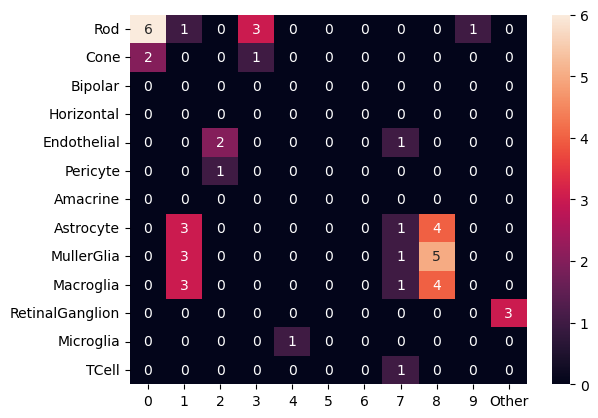

In [6]:
#### Marker genes

sc.tl.rank_genes_groups(retinas_all, 'leiden_sel', method='t-test')
sc.pl.rank_genes_groups(retinas_all, n_genes=25, sharey=False)



with open(os.path.join(FILEPATHBASE,'annData_ManualAnnotate','data', 'retinal_celltype_gates.json')) as f:                                                                                                                                                                                                                               
    gates = json.load(f)    

sc.tl.rank_genes_groups(retinas_all, 'leiden_sel', use_raw=True)
#sc.pl.rank_genes_groups(st_adata, n_genes=25, sharey=False)

marker_genes = {}
for item in gates:
    cell_type = item['cell']
    gene_list = [gene['gene'] for gene in item['gates']]
    marker_genes[cell_type] = gene_list


ov = sc.tl.marker_gene_overlap(retinas_all, marker_genes)

sns.heatmap(ov, annot=True)

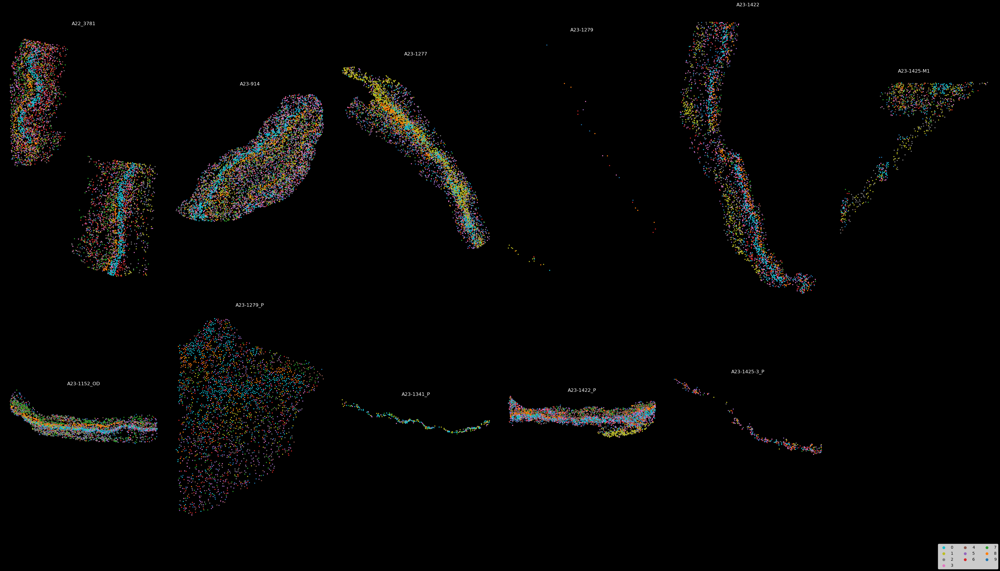

In [7]:
nRow = 2
nCol = int(np.ceil(len(Samples)/2))
fig, axs = plt.subplots(nRow, nCol, figsize=(35,20))
for r in np.arange(len(Samples)):
    ax = axs.reshape(-1)[r]
    ss = 10
    sq.pl.spatial_scatter(retinas_all[retinas_all.obs['dataset']==Samples[r]],
                          color='leiden',
                          groups=groups,
                          size=ss,
                          shape=None,
                          ax=ax,
                          palette=newpalette)
    ax.set_title(SampleKey[Samples[r]])
    
for ax in axs.reshape(-1):
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.axis('off')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    try:
        ax.get_legend().remove()
    except:
        pass
    
fig.tight_layout()

fig.set_facecolor('k')
for text in fig.findobj(match=lambda x: isinstance(x, plt.Text)):
    if hasattr(text, 'set_color'):
        text.set_color('white')



#axs[0].legend( labels_handles.values(), labels_handles.keys(), loc = "upper right", ncol=1)
    


labels_handles = {  label: handle for ax in fig.axes for handle, label in zip(*ax.get_legend_handles_labels())    }
fig.legend( labels_handles.values(), labels_handles.keys(), loc = "lower right", ncol=3)

In [8]:


f = os.path.join(FILEPATHBASE, FILEPATHBASE,'annData_ManualAnnotate','data','gwas-association-downloaded_2023-12-08-EFO_1001492-withChildTraits.tsv')
raw_in = pd.read_csv(f, delimiter='\t')

GWAS_Assoc_AMD_ = pd.Series([ss.strip() for ss in sum([re.split(', | -',str(s)) for s in raw_in['MAPPED_GENE']],[])]).unique()

Menon_2019_ = pd.Series([
    'PILRB',
    'SYN3',
    'TMEM97',
    'COL8A1',
    'CFH',
    'TNFRSF10A',
    'ADAMTS9-AS2',
    'CNN2',
    'VTN',
    'ACAD10',
    'C2',
    'TGFBR1',
    'C3',
    'PILRA',
    'ABCA1',
    'KMT2E',
    'COL4A3',
    'ARHGAP21',
    'APOE',
    'TIMP3',
    'CFI',
    'VEGFA',
    'TRPM3',
    'HTRA1',
    'RORB',
    'SRPK2']).unique()

GWAS_Assoc_AMD = retinas_all.var.index.intersection(GWAS_Assoc_AMD_).tolist()
Menon_2019 = retinas_all.var.index.intersection(Menon_2019_).tolist()

def MannWhitneyU(adata, genelists, rmax=1500):

    R = np.argsort(adata.X.T.toarray(), axis=0).argsort(axis=0)
    R[R>rmax] = rmax
    
    U_p = []
    for gl in genelists:
        S = [adata.var_names.get_loc(idx) for idx in gl]
        n = len(S)
        U = np.sum(R[S,:], axis=0) - (n*(n+1))/2
        U_p.append(1 - (U/(n*np.shape(R)[0])))
    
    return U_p

U_Menon_2019, U_GWAS_Assoc_AMD = MannWhitneyU(retinas_all, [Menon_2019, GWAS_Assoc_AMD], rmax=1500)

retinas_all.obs['Menon_2019_score'] = U_Menon_2019
retinas_all.obs['GWAS_AMD_score'] = U_GWAS_Assoc_AMD

In [9]:
retinas_all_glia = retinas_all.copy()
#retinas_all_glia = retinas_all_glia

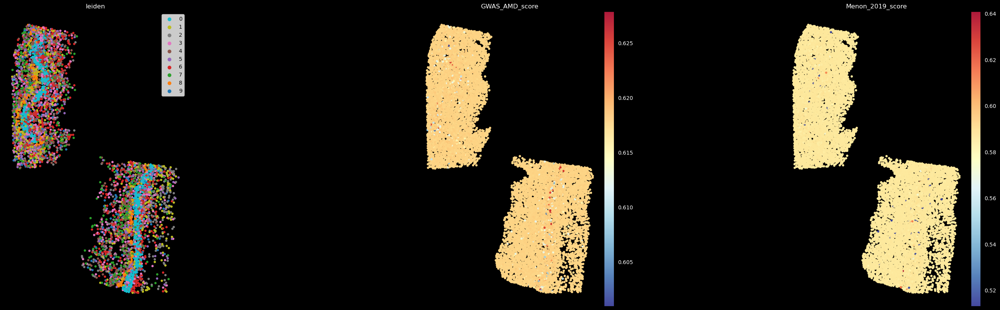

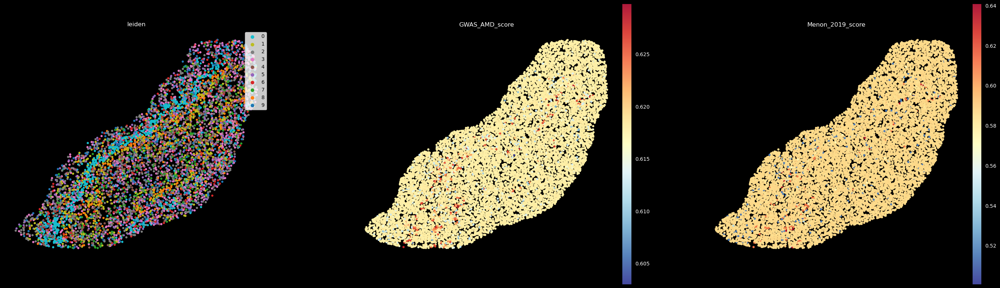

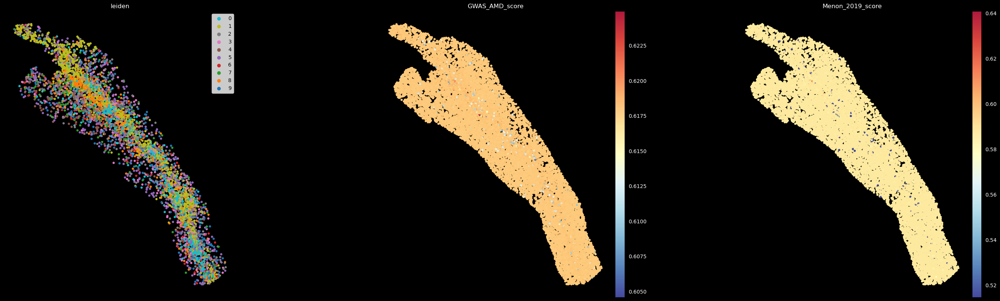

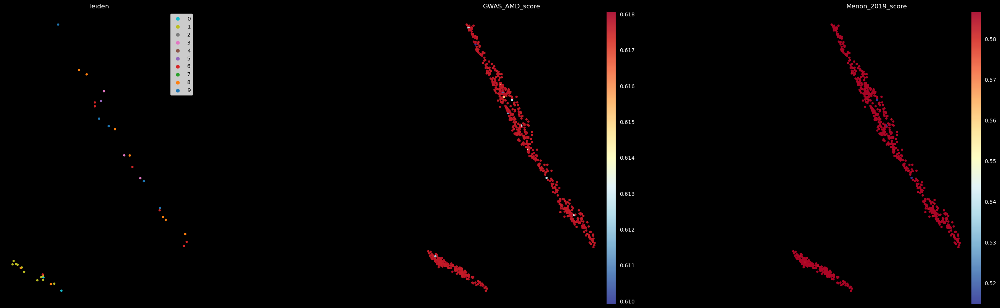

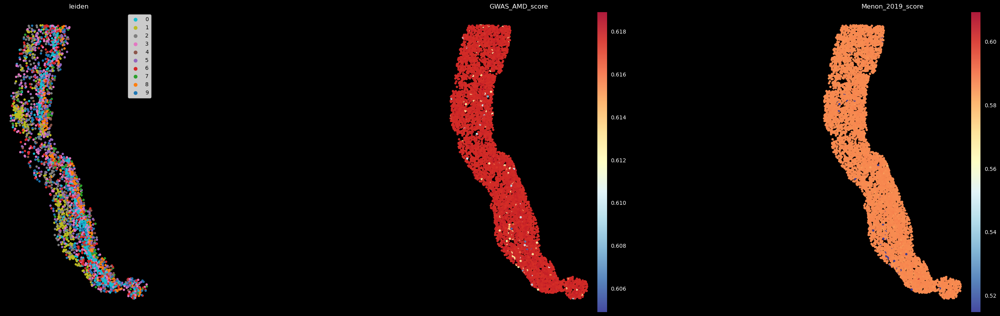

...

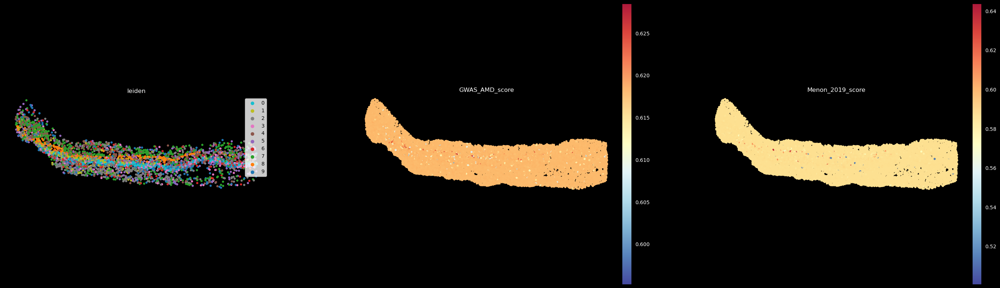

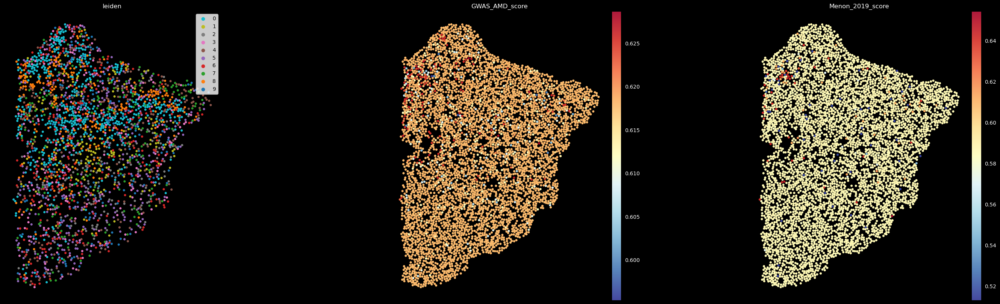

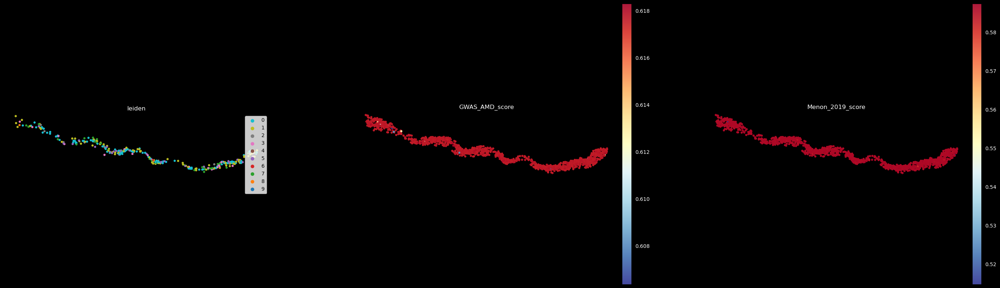

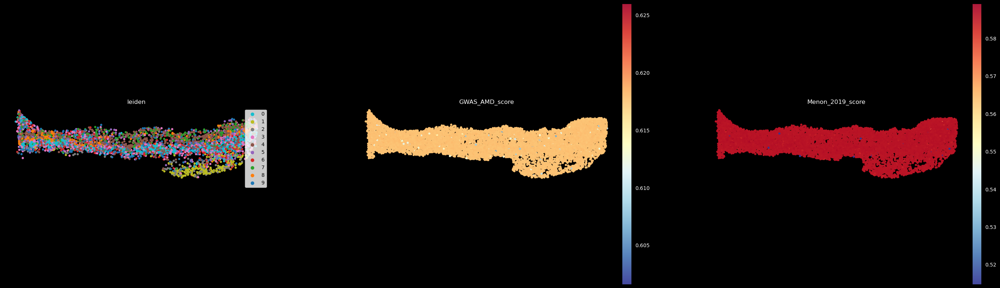

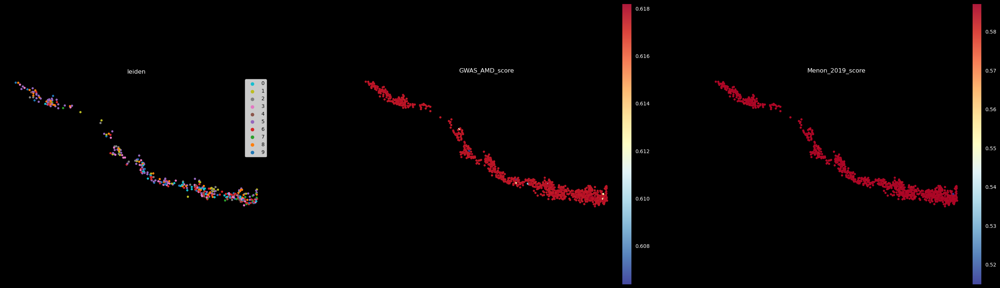

In [10]:

ss = 40
for r in np.arange(len(Samples)):
    fig, axs = plt.subplots(1, 3, figsize=(35,10))
    sq.pl.spatial_scatter(retinas_all[retinas_all.obs['dataset']==Samples[r]],
                                  color=['leiden', 'GWAS_AMD_score', 'Menon_2019_score'],
                                  groups=groups,
                                  na_color=(0,0,0,0),
                                  size=ss,
                                  shape=None,
                                  fig = fig,
                                  ax = axs,
                                  alpha=0.9,
                                  cmap='RdYlBu_r',
                                  legend_na=True,
                                  palette=newpalette)
    for ax in axs:
    # ax.set_title(SampleKey[Samples[r]])
        ax.set_facecolor('k')
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)

        
        
    #fig.tight_layout()
    fig.set_facecolor('k')
    for text in fig.findobj(match=lambda x: isinstance(x, plt.Text)):
        if hasattr(text, 'set_color'):
            text.set_color('white')
    
    axs[0].legend( labels_handles.values(), labels_handles.keys(), loc = "upper right", ncol=1)
    
#    ax_position = ax.get_position()
#    for c in fig.get_children()[-len(GenesToShow):]:
#        c_position = c.get_position()
#        c.set_position([c_position.x1 -0.02, ax_position.y0, 0.01, ax_position.height])


In [11]:

retinas_all.obs['leiden_sel']

AAAAAATGGAGAGC        7
AAAAAATGTCAGCA    Other
AAAAAGCATGTATG    Other
AAAAAGCGAAGCCG    Other
AAAAAGGGCGGTGC        6
                  ...  
CCCACCGTACTTTC    Other
GCAATGCTTACATA    Other
AACGTCTCGGGCGA    Other
GGCAAGCCGTCGGA    Other
GAGGTGGAATTGAA    Other
Name: leiden_sel, Length: 62961, dtype: category
Categories (11, object): ['0', '1', '2', '3', ..., '7', '8', '9', 'Other']

In [12]:

retinas_all.obs['leiden'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24',
       '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36',
       '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48',
       '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60',
       '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72',
       '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84',
       '85', '86', '87', '88', '89', '90', '91', '92', '93', '94', '95', '96',
       '97', '98', '99'],
      dtype='object')

Loading Data from: /home/mmd47/project/retina_curio/annData_ManualAnnotate/calc/retinas_all_integrated_harmony_nhood.h5ad
Done.


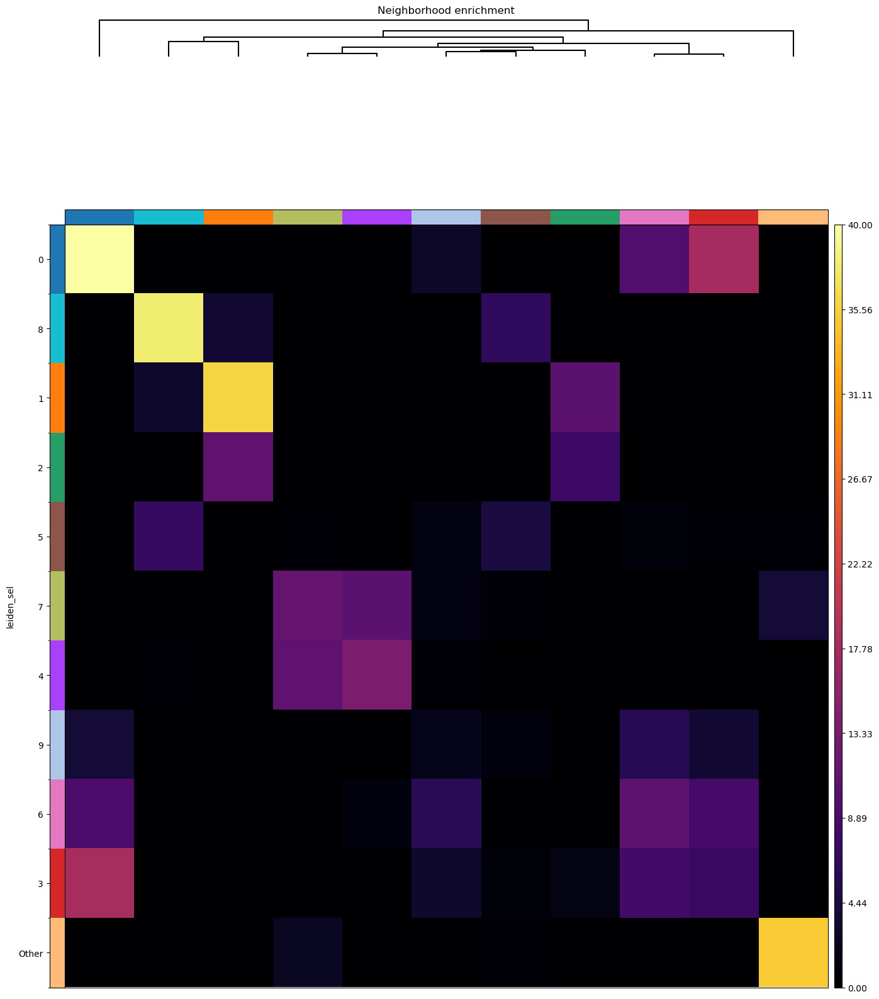

In [15]:
filename = os.path.join(FILEPATHBASE,'annData_ManualAnnotate', 'calc', 'retinas_all_integrated_harmony_nhood.h5ad')
print("Loading Data from: " + filename)
retinas_all = ad.read_h5ad(filename)
print('Done.')


fig, ax = plt.subplots(1, 1, figsize=(35,20))
sq.pl.nhood_enrichment(
    retinas_all,
    cluster_key="leiden_sel",
    mode="zscore",
    method="ward",
    cmap="inferno",
    vmin=0,
    vmax=40,
    figsize=(5, 5),
    ax=ax
)


In [16]:
sq.gr.co_occurrence(retinas_all, cluster_key="leiden_sel")
sq.pl.co_occurrence(
    retinas_all,
    cluster_key="leiden_sel",
    palette=newpalette,
    clusters=["3"],
    figsize=(10, 5),
)

  0%|          | 0/496 [00:00<?, ?/s]

KeyboardInterrupt: 

In [ ]:
sq.gr.ligrec(
    retinas_all,
    n_perms=100,
    cluster_key="leiden_sel",
)
sq.pl.ligrec(
    retinas_all,
    cluster_key="leiden_sel",
    source_groups="0",
    target_groups=["9", "6", "3"],
    means_range=(0.3, np.inf),
    alpha=1e-4,
    swap_axes=True,
)



In [ ]:
#np.shape(retinas_all.obsm['X_spatial'][retinas_all.obs['leiden_sel']=='0' & retinas_all.obs['dataset']=='R1'])

In [ ]:
sc.pp.calculate_qc_metrics(retinas_all, inplace=True)

In [ ]:
import phate
import scprep


phate_operator = phate.PHATE(n_jobs=-2)


#phate_operator = phate.PHATE(knn=4, decay=15, t=12, n_jobs=-2)

Y_phate = phate_operator.fit_transform(retinas_all)

import pickle 
filename = os.path.join(FILEPATHBASE,'annData_ManualAnnotate', 'calc', 'retinas_all_PHATE.pickle')
with open(filename, 'w') as file:
    pickle.dump(Y_phate, file)
    
phate_operator.set_params(n_components=3)
Y_phate_3d = phate_operator.transform()
scprep.plot.scatter3d(Y_phate_3d, c=sample_labels, figsize=(8,6), cmap="Spectral",
                      ticks=False, label_prefix="PHATE")

Calculating PHATE...
  Running PHATE on 62961 observations and 3000 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 1.53 seconds.
    Calculating KNN search...
    Calculated KNN search in 714.30 seconds.
    Calculating affinities...


NameError: name 'phate_operator' is not defined